In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.4.0


In [5]:
!wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip

--2020-12-22 08:48:25--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘apple2orange.zip’

apple2orange.zip    100%[===================>]  74.82M  32.5MB/s    in 2.3s    

2020-12-22 08:48:27 (32.5 MB/s) - ‘apple2orange.zip’ saved [78456409/78456409]



In [6]:
!unzip apple2orange.zip

Archive:  apple2orange.zip
   creating: apple2orange/
   creating: apple2orange/trainA/
  inflating: apple2orange/trainA/n07740461_6908.jpg  
  inflating: apple2orange/trainA/n07740461_7635.jpg  
  inflating: apple2orange/trainA/n07740461_586.jpg  
  inflating: apple2orange/trainA/n07740461_9813.jpg  
  inflating: apple2orange/trainA/n07740461_6835.jpg  
  inflating: apple2orange/trainA/n07740461_2818.jpg  
  inflating: apple2orange/trainA/n07740461_2918.jpg  
  inflating: apple2orange/trainA/n07740461_1213.jpg  
  inflating: apple2orange/trainA/n07740461_2476.jpg  
  inflating: apple2orange/trainA/n07740461_13596.jpg  
  inflating: apple2orange/trainA/n07740461_4093.jpg  
  inflating: apple2orange/trainA/n07740461_14738.jpg  
  inflating: apple2orange/trainA/n07740461_6477.jpg  
  inflating: apple2orange/trainA/n07740461_11356.jpg  
  inflating: apple2orange/trainA/n07740461_7594.jpg  
  inflating: apple2orange/trainA/n07740461_5119.jpg  
  inflating: apple2orange/trainA/n07740461_104

In [7]:
!ls apple2orange

testA  testB  trainA  trainB


In [8]:
import glob
apples_train = glob.glob('apple2orange/trainA/*.jpg')
oranges_train = glob.glob('apple2orange/trainB/*.jpg')
apples_test = glob.glob('apple2orange/testA/*.jpg')
oranges_test = glob.glob('apple2orange/testB/*.jpg')

In [9]:
len(apples_train), len(oranges_train), len(apples_test), len(oranges_test)

(995, 1019, 266, 248)

In [10]:
import cv2
for file in apples_train[:10]:
    img = cv2.imread(file)
    print (img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


Apples


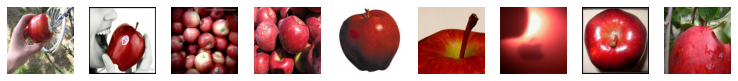

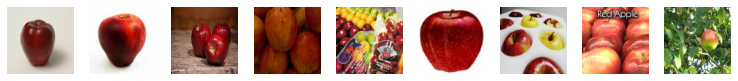

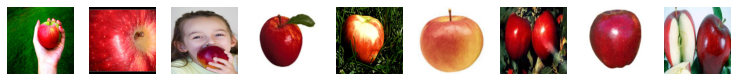

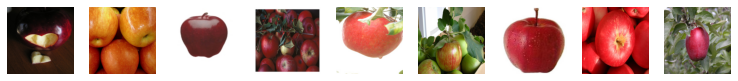

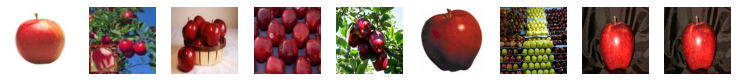

--------------------------------------------------------------------------------
Oranges


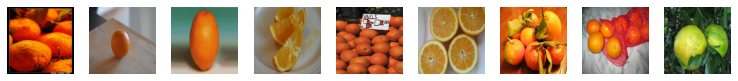

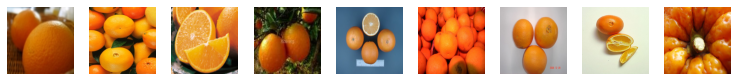

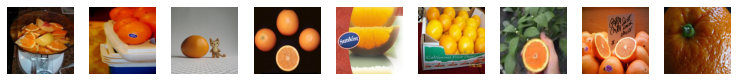

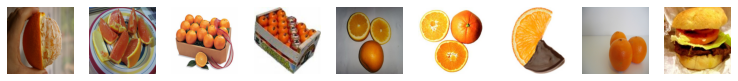

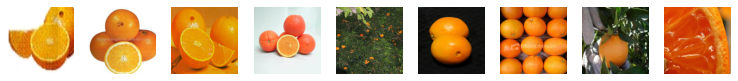

In [11]:
print ("Apples")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(apples_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("Oranges")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(oranges_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Generator Model (U-Net Like)

In [12]:
def encoder_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
    return x

def decoder_layer(input_layer, skip_input, filters):
    #x = tensorflow.keras.layers.UpSampling2D(size=2)(input_layer)
    x = tensorflow.keras.layers.Conv2DTranspose(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.Activation('relu')(x)
    x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
    x = tensorflow.keras.layers.Concatenate()([x, skip_input])
    return x

In [13]:
source_image_A = tensorflow.keras.layers.Input(shape=(256, 256, 3))
source_image_B = tensorflow.keras.layers.Input(shape=(256, 256, 3))
source_image = tensorflow.keras.layers.Input(shape=(256, 256, 3))

e1 = encoder_layer(source_image, 32, bn=False)
e2 = encoder_layer(e1, 64)
e3 = encoder_layer(e2, 128)
e4 = encoder_layer(e3, 256)
e5 = encoder_layer(e4, 256)
e6 = encoder_layer(e5, 256)
e7 = encoder_layer(e6, 256)

bottle_neck = tensorflow.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same')(e7)
b = tensorflow.keras.layers.Activation('relu')(bottle_neck)

d1 = decoder_layer(b, e7, 256)
d2 = decoder_layer(d1, e6, 256)
d3 = decoder_layer(d2, e5, 256)
d4 = decoder_layer(d3, e4, 256)
d5 = decoder_layer(d4, e3, 256)
d6 = decoder_layer(d5, e2, 64)
d7 = decoder_layer(d6, e1, 32)

decoded = tensorflow.keras.layers.Conv2DTranspose(3, kernel_size=(4,4), strides=(2,2), padding='same')(d7)
translated_image = tensorflow.keras.layers.Activation('tanh')(decoded)

generator_network_AB = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)
generator_network_BA = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

print (generator_network_AB.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 1568        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 64)   32832       leaky_re_lu[0][0]                
______________________________________________________________________________________________

# Discriminator Network

In [14]:
def my_conv_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
    return x

In [15]:
target_image_input = tensorflow.keras.layers.Input(shape=(256, 256, 3))

x = my_conv_layer(target_image_input, 64, bn=False)
x = my_conv_layer(x, 128)
x = my_conv_layer(x, 256)
x = my_conv_layer(x, 512)

patch_features = tensorflow.keras.layers.Conv2D(1, kernel_size=(4,4), strides=(1,1), padding='same')(x)

discriminator_network_A = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)
discriminator_network_B = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

print (discriminator_network_A.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 128, 128, 64)      3136      
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 64, 64, 128)       131200    
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
batch_normalization_13 (Batc (None, 64, 64, 128)       512       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 32, 32, 256)       5245

In [16]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network_A.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])
discriminator_network_B.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])

# Cycle-GAN

In [17]:
# Domain Transfer
fake_B = generator_network_AB(source_image_A)
fake_A = generator_network_BA(source_image_B)

# Restoring original Domain
get_back_A = generator_network_BA(fake_B)
get_back_B = generator_network_AB(fake_A)

# Get back Identical/Same Image
get_same_A = generator_network_BA(source_image_A)
get_same_B = generator_network_AB(source_image_B)
  
discriminator_network_A.trainable=False
discriminator_network_B.trainable=False

# Tell Real vs Fake, for a given domain
verify_A = discriminator_network_A(fake_A)
verify_B = discriminator_network_B(fake_B)

cycle_gan = tensorflow.keras.models.Model(inputs = [source_image_A, source_image_B], \
                              outputs = [verify_A, verify_B, get_back_A, get_back_B, get_same_A, get_same_B])
cycle_gan.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Functional)            (None, 256, 256, 3)  16893635    input_2[0][0]                    
                                                                 model[0][0]                      
                                                                 input_1[0][0]                    
____________________________________________________________________________________________

# Compiling Models

In [18]:
cycle_gan.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'], loss_weights=[1, 1, 10, 10, 1, 1],\
                                          optimizer=adam_optimizer)

# Define Data Generators

In [20]:
def apples_to_oranges(apples, generator_network):
    generated_samples = generator_network.predict_on_batch(apples)
    return generated_samples

def oranges_to_apples(oranges, generator_network):
    generated_samples = generator_network.predict_on_batch(oranges)
    return generated_samples

def get_apple_samples(batch_size):
    random_files = np.random.choice(apples_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    apple_images = np.array(images)
    return apple_images

def get_orange_samples(batch_size):
    random_files = np.random.choice(oranges_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    orange_images = np.array(images)
    return orange_images

def show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA):
    images = []
    for j in range(5):
        file = np.random.choice(apples_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Apple Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(550 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated Orange Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated back to Apples')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

def show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA):
    images = []
    for j in range(5):
        file = np.random.choice(oranges_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Orange Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(550 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated Apple Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated back to Oranges')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Training GAN

In [21]:
len(apples_train), len(oranges_train)

(995, 1019)

Input Apple Images


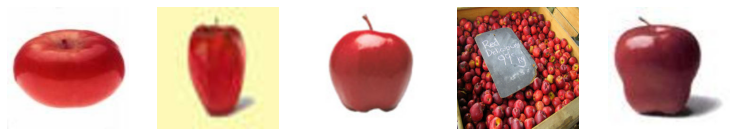

Translated Orange Images


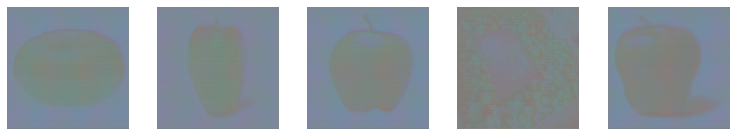

Translated back to Apples


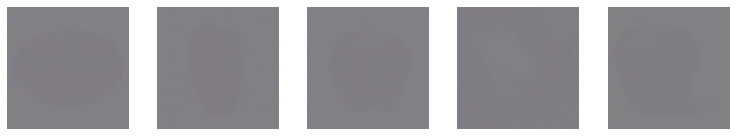

Epoch:0, Step:0, DA-Loss:18.235, DA-Acc:45.898, DB-Loss:7.339, DB-Acc:52.336, G-Loss:16.766
Epoch:0, Step:5, DA-Loss:1.718, DA-Acc:47.695, DB-Loss:1.343, DB-Acc:48.043, G-Loss:10.340
Epoch:0, Step:10, DA-Loss:0.670, DA-Acc:53.074, DB-Loss:0.513, DB-Acc:51.770, G-Loss:7.568
Epoch:0, Step:15, DA-Loss:0.380, DA-Acc:58.758, DB-Loss:0.381, DB-Acc:57.469, G-Loss:6.223
Epoch:1, Step:0, DA-Loss:0.313, DA-Acc:61.379, DB-Loss:0.308, DB-Acc:59.652, G-Loss:4.911
Epoch:1, Step:5, DA-Loss:0.284, DA-Acc:64.676, DB-Loss:0.298, DB-Acc:63.391, G-Loss:4.896
Epoch:1, Step:10, DA-Loss:0.659, DA-Acc:62.879, DB-Loss:0.511, DB-Acc:56.703, G-Loss:5.466
Epoch:1, Step:15, DA-Loss:0.249, DA-Acc:64.937, DB-Loss:0.250, DB-Acc:64.207, G-Loss:4.052
Epoch:2, Step:0, DA-Loss:0.235, DA-Acc:66.992, DB-Loss:0.230, DB-Acc:67.270, G-Loss:3.637
Epoch:2, Step:5, DA-Loss:0.284, DA-Acc:64.055, DB-Loss:0.314, DB-Acc:63.477, G-Loss:3.796
Epoch:2, Step:10, DA-Loss:0.252, DA-Acc:64.535, DB-Loss:0.241, DB-Acc:67.066, G-Loss:3.545
Ep

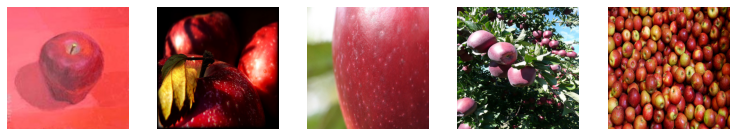

Translated Orange Images


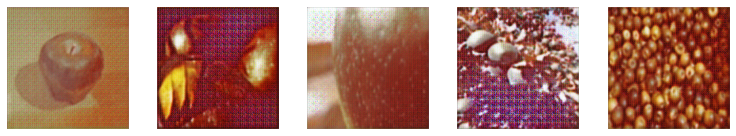

Translated back to Apples


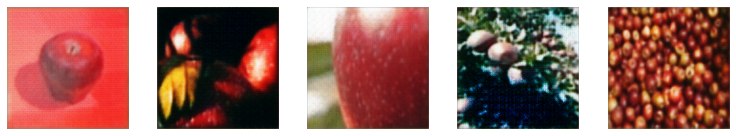

Epoch:5, Step:0, DA-Loss:0.528, DA-Acc:65.910, DB-Loss:0.304, DB-Acc:71.012, G-Loss:2.967
Epoch:5, Step:5, DA-Loss:0.227, DA-Acc:78.648, DB-Loss:0.219, DB-Acc:78.184, G-Loss:2.732
Epoch:5, Step:10, DA-Loss:0.129, DA-Acc:84.824, DB-Loss:0.172, DB-Acc:78.836, G-Loss:2.981
Epoch:5, Step:15, DA-Loss:1.272, DA-Acc:53.105, DB-Loss:1.214, DB-Acc:57.488, G-Loss:12.549
Epoch:6, Step:0, DA-Loss:0.245, DA-Acc:72.813, DB-Loss:0.187, DB-Acc:75.289, G-Loss:4.766
Epoch:6, Step:5, DA-Loss:0.117, DA-Acc:86.883, DB-Loss:0.125, DB-Acc:85.492, G-Loss:3.771
Epoch:6, Step:10, DA-Loss:0.107, DA-Acc:88.230, DB-Loss:0.116, DB-Acc:85.578, G-Loss:3.474
Epoch:6, Step:15, DA-Loss:0.139, DA-Acc:82.594, DB-Loss:0.119, DB-Acc:87.070, G-Loss:3.016
Epoch:7, Step:0, DA-Loss:0.114, DA-Acc:87.262, DB-Loss:0.117, DB-Acc:85.703, G-Loss:2.821
Epoch:7, Step:5, DA-Loss:0.184, DA-Acc:78.410, DB-Loss:0.237, DB-Acc:81.988, G-Loss:2.857
Epoch:7, Step:10, DA-Loss:0.234, DA-Acc:79.891, DB-Loss:0.164, DB-Acc:79.020, G-Loss:2.799
Epoc

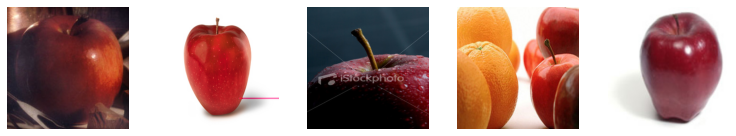

Translated Orange Images


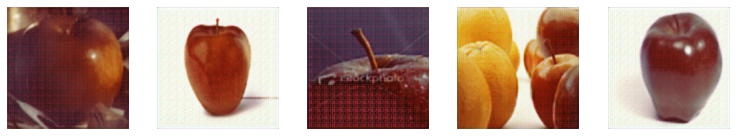

Translated back to Apples


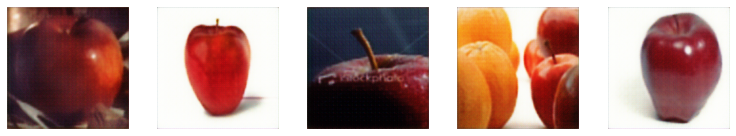

Epoch:10, Step:0, DA-Loss:0.087, DA-Acc:93.469, DB-Loss:0.084, DB-Acc:93.773, G-Loss:2.453
Epoch:10, Step:5, DA-Loss:0.096, DA-Acc:93.035, DB-Loss:0.092, DB-Acc:91.680, G-Loss:2.071
Epoch:10, Step:10, DA-Loss:0.047, DA-Acc:96.816, DB-Loss:0.058, DB-Acc:97.395, G-Loss:2.024
Epoch:10, Step:15, DA-Loss:0.045, DA-Acc:98.395, DB-Loss:0.057, DB-Acc:95.480, G-Loss:2.216
Epoch:11, Step:0, DA-Loss:0.085, DA-Acc:94.336, DB-Loss:0.118, DB-Acc:90.062, G-Loss:2.271
Epoch:11, Step:5, DA-Loss:0.075, DA-Acc:96.434, DB-Loss:0.066, DB-Acc:94.602, G-Loss:2.061
Epoch:11, Step:10, DA-Loss:0.041, DA-Acc:98.629, DB-Loss:0.039, DB-Acc:98.160, G-Loss:1.891
Epoch:11, Step:15, DA-Loss:0.030, DA-Acc:99.230, DB-Loss:0.039, DB-Acc:98.340, G-Loss:2.223
Epoch:12, Step:0, DA-Loss:0.070, DA-Acc:97.492, DB-Loss:0.083, DB-Acc:93.809, G-Loss:2.056
Epoch:12, Step:5, DA-Loss:0.214, DA-Acc:82.672, DB-Loss:0.155, DB-Acc:86.941, G-Loss:2.177
Epoch:12, Step:10, DA-Loss:0.164, DA-Acc:92.855, DB-Loss:0.130, DB-Acc:92.719, G-Loss:

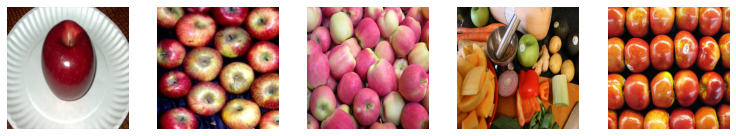

Translated Orange Images


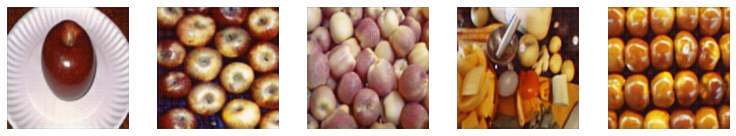

Translated back to Apples


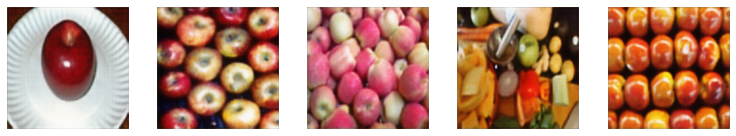

Epoch:15, Step:0, DA-Loss:0.103, DA-Acc:94.836, DB-Loss:0.109, DB-Acc:88.477, G-Loss:2.008
Epoch:15, Step:5, DA-Loss:0.184, DA-Acc:88.988, DB-Loss:0.142, DB-Acc:87.211, G-Loss:1.873
Epoch:15, Step:10, DA-Loss:0.228, DA-Acc:87.281, DB-Loss:0.115, DB-Acc:91.379, G-Loss:1.829
Epoch:15, Step:15, DA-Loss:0.576, DA-Acc:67.855, DB-Loss:3.669, DB-Acc:52.766, G-Loss:37.980
Epoch:16, Step:0, DA-Loss:0.284, DA-Acc:53.320, DB-Loss:0.292, DB-Acc:54.168, G-Loss:6.148
Epoch:16, Step:5, DA-Loss:0.135, DA-Acc:85.520, DB-Loss:0.142, DB-Acc:83.535, G-Loss:4.868
Epoch:16, Step:10, DA-Loss:0.109, DA-Acc:87.512, DB-Loss:0.100, DB-Acc:91.336, G-Loss:4.363
Epoch:16, Step:15, DA-Loss:0.074, DA-Acc:93.914, DB-Loss:0.090, DB-Acc:93.125, G-Loss:3.845
Epoch:17, Step:0, DA-Loss:0.076, DA-Acc:94.973, DB-Loss:0.053, DB-Acc:97.523, G-Loss:3.457
Epoch:17, Step:5, DA-Loss:0.079, DA-Acc:96.582, DB-Loss:0.079, DB-Acc:95.473, G-Loss:3.506
Epoch:17, Step:10, DA-Loss:0.058, DA-Acc:96.570, DB-Loss:0.115, DB-Acc:88.434, G-Loss

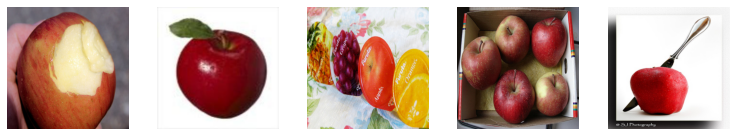

Translated Orange Images


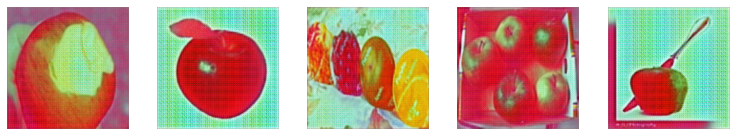

Translated back to Apples


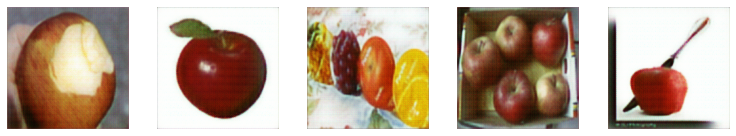

Epoch:20, Step:0, DA-Loss:0.095, DA-Acc:95.430, DB-Loss:0.256, DB-Acc:82.652, G-Loss:2.593
Epoch:20, Step:5, DA-Loss:0.068, DA-Acc:95.547, DB-Loss:0.114, DB-Acc:92.348, G-Loss:2.795
Epoch:20, Step:10, DA-Loss:0.029, DA-Acc:99.680, DB-Loss:0.069, DB-Acc:95.148, G-Loss:2.589
Epoch:20, Step:15, DA-Loss:0.241, DA-Acc:83.184, DB-Loss:0.052, DB-Acc:97.906, G-Loss:2.353
Epoch:21, Step:0, DA-Loss:0.058, DA-Acc:96.586, DB-Loss:0.023, DB-Acc:99.266, G-Loss:2.392
Epoch:21, Step:5, DA-Loss:0.206, DA-Acc:80.184, DB-Loss:0.225, DB-Acc:76.824, G-Loss:2.436
Epoch:21, Step:10, DA-Loss:0.054, DA-Acc:95.621, DB-Loss:0.074, DB-Acc:96.094, G-Loss:2.414
Epoch:21, Step:15, DA-Loss:0.049, DA-Acc:98.363, DB-Loss:0.044, DB-Acc:98.141, G-Loss:2.223
Epoch:22, Step:0, DA-Loss:0.065, DA-Acc:95.449, DB-Loss:0.052, DB-Acc:97.352, G-Loss:2.231
Epoch:22, Step:5, DA-Loss:0.022, DA-Acc:99.844, DB-Loss:0.061, DB-Acc:96.922, G-Loss:2.158
Epoch:22, Step:10, DA-Loss:0.071, DA-Acc:97.566, DB-Loss:0.184, DB-Acc:87.605, G-Loss:

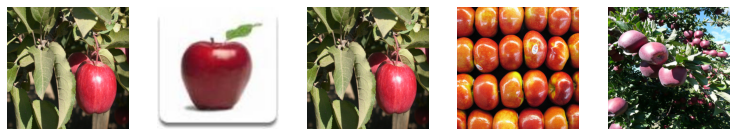

Translated Orange Images


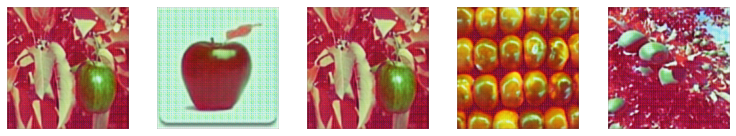

Translated back to Apples


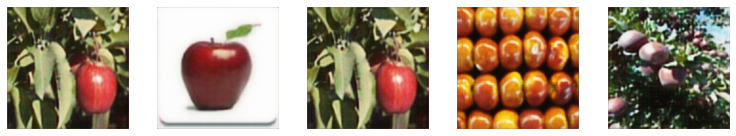

Epoch:25, Step:0, DA-Loss:0.086, DA-Acc:96.316, DB-Loss:0.148, DB-Acc:90.348, G-Loss:2.011
Epoch:25, Step:5, DA-Loss:0.075, DA-Acc:93.543, DB-Loss:0.181, DB-Acc:85.984, G-Loss:2.222
Epoch:25, Step:10, DA-Loss:0.123, DA-Acc:91.285, DB-Loss:0.170, DB-Acc:87.961, G-Loss:2.765
Epoch:25, Step:15, DA-Loss:0.246, DA-Acc:83.863, DB-Loss:0.231, DB-Acc:86.574, G-Loss:2.241
Epoch:26, Step:0, DA-Loss:0.227, DA-Acc:86.203, DB-Loss:0.216, DB-Acc:82.109, G-Loss:2.328
Epoch:26, Step:5, DA-Loss:0.146, DA-Acc:89.605, DB-Loss:0.164, DB-Acc:88.613, G-Loss:2.070
Epoch:26, Step:10, DA-Loss:0.063, DA-Acc:98.445, DB-Loss:0.089, DB-Acc:95.684, G-Loss:2.296
Epoch:26, Step:15, DA-Loss:0.086, DA-Acc:94.199, DB-Loss:0.173, DB-Acc:87.469, G-Loss:2.239
Epoch:27, Step:0, DA-Loss:0.121, DA-Acc:87.988, DB-Loss:0.124, DB-Acc:94.285, G-Loss:2.074
Epoch:27, Step:5, DA-Loss:0.060, DA-Acc:98.191, DB-Loss:0.050, DB-Acc:96.609, G-Loss:2.122
Epoch:27, Step:10, DA-Loss:0.031, DA-Acc:99.754, DB-Loss:0.034, DB-Acc:98.242, G-Loss:

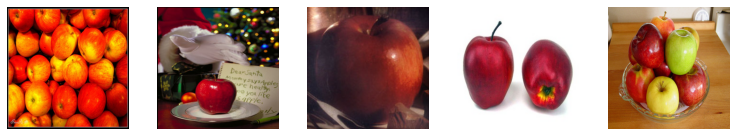

Translated Orange Images


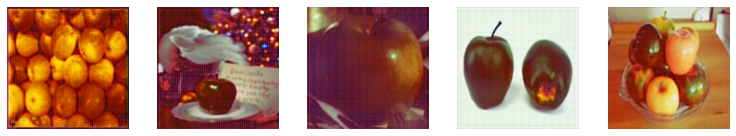

Translated back to Apples


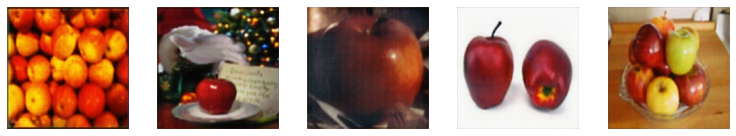

Epoch:30, Step:0, DA-Loss:0.023, DA-Acc:99.805, DB-Loss:0.024, DB-Acc:99.934, G-Loss:1.793
Epoch:30, Step:5, DA-Loss:0.033, DA-Acc:97.977, DB-Loss:0.028, DB-Acc:99.781, G-Loss:1.777
Epoch:30, Step:10, DA-Loss:0.076, DA-Acc:96.906, DB-Loss:0.059, DB-Acc:96.051, G-Loss:1.804
Epoch:30, Step:15, DA-Loss:0.015, DA-Acc:99.949, DB-Loss:0.013, DB-Acc:99.996, G-Loss:1.824
Epoch:31, Step:0, DA-Loss:0.051, DA-Acc:97.156, DB-Loss:0.072, DB-Acc:96.953, G-Loss:1.900
Epoch:31, Step:5, DA-Loss:0.031, DA-Acc:99.238, DB-Loss:0.064, DB-Acc:97.629, G-Loss:1.795
Epoch:31, Step:10, DA-Loss:0.020, DA-Acc:99.973, DB-Loss:0.020, DB-Acc:99.973, G-Loss:1.709
Epoch:31, Step:15, DA-Loss:0.040, DA-Acc:99.457, DB-Loss:0.028, DB-Acc:98.996, G-Loss:1.892
Epoch:32, Step:0, DA-Loss:0.062, DA-Acc:97.207, DB-Loss:0.214, DB-Acc:89.547, G-Loss:2.070
Epoch:32, Step:5, DA-Loss:0.052, DA-Acc:99.133, DB-Loss:0.062, DB-Acc:97.117, G-Loss:1.834
Epoch:32, Step:10, DA-Loss:0.032, DA-Acc:99.703, DB-Loss:0.064, DB-Acc:97.422, G-Loss:

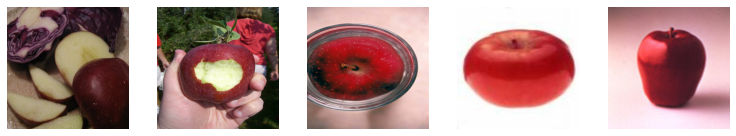

Translated Orange Images


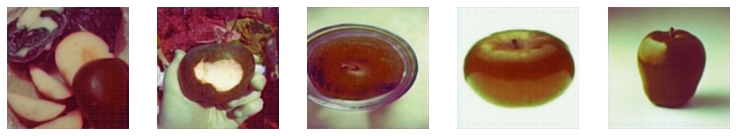

Translated back to Apples


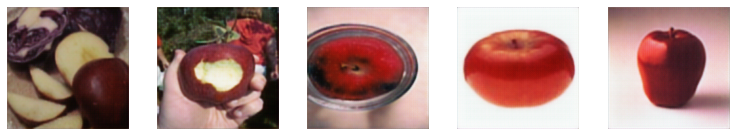

Epoch:35, Step:0, DA-Loss:0.011, DA-Acc:99.992, DB-Loss:0.021, DB-Acc:99.520, G-Loss:1.583
Epoch:35, Step:5, DA-Loss:0.020, DA-Acc:99.871, DB-Loss:0.031, DB-Acc:99.617, G-Loss:1.689
Epoch:35, Step:10, DA-Loss:0.063, DA-Acc:95.441, DB-Loss:0.066, DB-Acc:97.535, G-Loss:1.692
Epoch:35, Step:15, DA-Loss:0.121, DA-Acc:92.172, DB-Loss:0.141, DB-Acc:93.035, G-Loss:1.617
Epoch:36, Step:0, DA-Loss:0.029, DA-Acc:99.762, DB-Loss:0.050, DB-Acc:97.687, G-Loss:1.868
Epoch:36, Step:5, DA-Loss:0.029, DA-Acc:99.660, DB-Loss:0.028, DB-Acc:99.945, G-Loss:1.709
Epoch:36, Step:10, DA-Loss:0.034, DA-Acc:99.805, DB-Loss:0.033, DB-Acc:98.848, G-Loss:1.561
Epoch:36, Step:15, DA-Loss:0.041, DA-Acc:98.125, DB-Loss:0.040, DB-Acc:99.062, G-Loss:1.584
Epoch:37, Step:0, DA-Loss:0.127, DA-Acc:93.051, DB-Loss:0.071, DB-Acc:96.633, G-Loss:1.754
Epoch:37, Step:5, DA-Loss:0.054, DA-Acc:98.219, DB-Loss:0.069, DB-Acc:98.125, G-Loss:1.650
Epoch:37, Step:10, DA-Loss:0.042, DA-Acc:97.785, DB-Loss:0.047, DB-Acc:98.023, G-Loss:

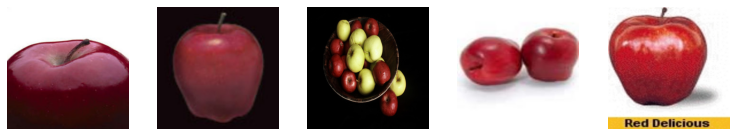

Translated Orange Images


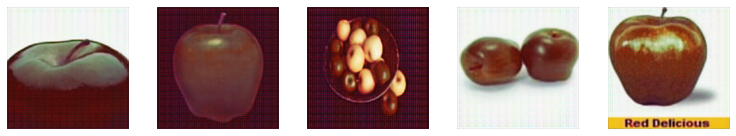

Translated back to Apples


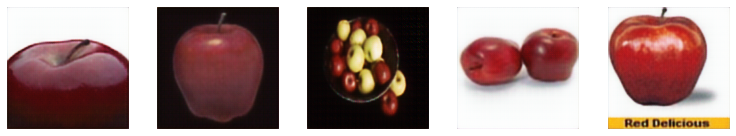

Epoch:40, Step:0, DA-Loss:0.050, DA-Acc:99.254, DB-Loss:0.044, DB-Acc:97.875, G-Loss:1.624
Epoch:40, Step:5, DA-Loss:0.034, DA-Acc:100.000, DB-Loss:0.054, DB-Acc:96.605, G-Loss:1.551
Epoch:40, Step:10, DA-Loss:0.031, DA-Acc:99.730, DB-Loss:0.032, DB-Acc:98.398, G-Loss:1.700
Epoch:40, Step:15, DA-Loss:0.041, DA-Acc:99.484, DB-Loss:0.044, DB-Acc:98.844, G-Loss:1.651
Epoch:41, Step:0, DA-Loss:0.109, DA-Acc:93.227, DB-Loss:0.139, DB-Acc:92.605, G-Loss:1.727
Epoch:41, Step:5, DA-Loss:0.069, DA-Acc:96.387, DB-Loss:0.074, DB-Acc:98.031, G-Loss:1.529
Epoch:41, Step:10, DA-Loss:0.039, DA-Acc:99.160, DB-Loss:0.045, DB-Acc:96.402, G-Loss:1.609
Epoch:41, Step:15, DA-Loss:0.025, DA-Acc:99.992, DB-Loss:0.023, DB-Acc:99.437, G-Loss:1.576
Epoch:42, Step:0, DA-Loss:0.045, DA-Acc:99.359, DB-Loss:0.046, DB-Acc:96.977, G-Loss:1.586
Epoch:42, Step:5, DA-Loss:0.061, DA-Acc:96.996, DB-Loss:0.111, DB-Acc:96.992, G-Loss:1.529
Epoch:42, Step:10, DA-Loss:0.034, DA-Acc:99.629, DB-Loss:0.049, DB-Acc:97.465, G-Loss

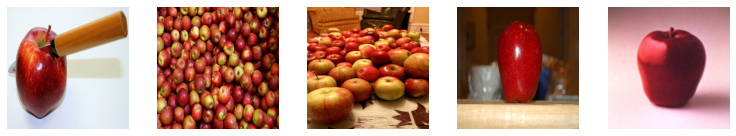

Translated Orange Images


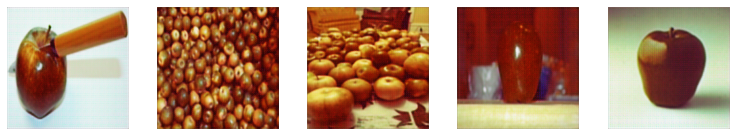

Translated back to Apples


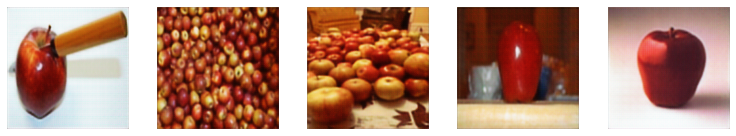

Epoch:45, Step:0, DA-Loss:0.033, DA-Acc:99.535, DB-Loss:0.041, DB-Acc:98.855, G-Loss:1.637
Epoch:45, Step:5, DA-Loss:0.039, DA-Acc:99.512, DB-Loss:0.083, DB-Acc:94.188, G-Loss:1.833
Epoch:45, Step:10, DA-Loss:0.030, DA-Acc:98.773, DB-Loss:0.042, DB-Acc:98.578, G-Loss:1.715
Epoch:45, Step:15, DA-Loss:0.040, DA-Acc:97.758, DB-Loss:0.051, DB-Acc:99.707, G-Loss:1.534
Epoch:46, Step:0, DA-Loss:0.030, DA-Acc:99.105, DB-Loss:0.141, DB-Acc:94.000, G-Loss:1.553
Epoch:46, Step:5, DA-Loss:0.036, DA-Acc:98.891, DB-Loss:0.046, DB-Acc:99.867, G-Loss:1.500
Epoch:46, Step:10, DA-Loss:0.077, DA-Acc:95.723, DB-Loss:0.091, DB-Acc:93.602, G-Loss:1.557
Epoch:46, Step:15, DA-Loss:0.364, DA-Acc:65.965, DB-Loss:0.642, DB-Acc:56.715, G-Loss:3.490
Epoch:47, Step:0, DA-Loss:0.139, DA-Acc:82.879, DB-Loss:0.160, DB-Acc:78.887, G-Loss:2.781
Epoch:47, Step:5, DA-Loss:0.066, DA-Acc:94.559, DB-Loss:0.082, DB-Acc:93.758, G-Loss:2.532
Epoch:47, Step:10, DA-Loss:0.107, DA-Acc:92.164, DB-Loss:0.169, DB-Acc:84.055, G-Loss:

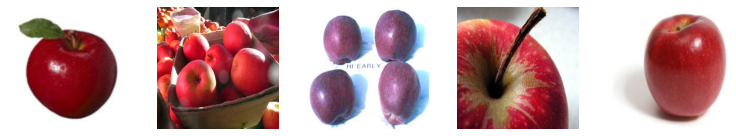

Translated Orange Images


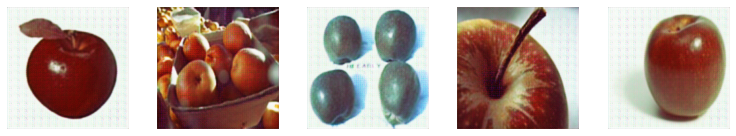

Translated back to Apples


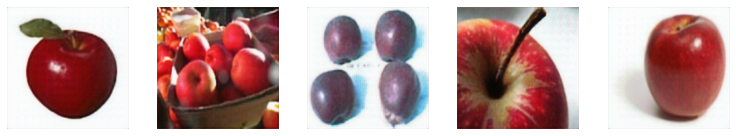

Epoch:50, Step:0, DA-Loss:0.045, DA-Acc:97.348, DB-Loss:0.056, DB-Acc:99.773, G-Loss:1.711
Epoch:50, Step:5, DA-Loss:0.175, DA-Acc:83.871, DB-Loss:0.521, DB-Acc:63.543, G-Loss:2.111
Epoch:50, Step:10, DA-Loss:0.072, DA-Acc:95.469, DB-Loss:0.128, DB-Acc:92.816, G-Loss:1.704
Epoch:50, Step:15, DA-Loss:0.034, DA-Acc:98.652, DB-Loss:0.033, DB-Acc:99.715, G-Loss:1.702
Epoch:51, Step:0, DA-Loss:0.029, DA-Acc:98.352, DB-Loss:0.036, DB-Acc:99.598, G-Loss:1.718
Epoch:51, Step:5, DA-Loss:0.023, DA-Acc:99.848, DB-Loss:0.045, DB-Acc:99.996, G-Loss:1.850
Epoch:51, Step:10, DA-Loss:0.042, DA-Acc:99.246, DB-Loss:0.053, DB-Acc:96.988, G-Loss:1.486
Epoch:51, Step:15, DA-Loss:0.045, DA-Acc:98.660, DB-Loss:0.041, DB-Acc:99.234, G-Loss:1.676
Epoch:52, Step:0, DA-Loss:0.058, DA-Acc:96.633, DB-Loss:0.050, DB-Acc:98.238, G-Loss:1.851
Epoch:52, Step:5, DA-Loss:0.030, DA-Acc:98.453, DB-Loss:0.028, DB-Acc:99.758, G-Loss:1.728
Epoch:52, Step:10, DA-Loss:0.061, DA-Acc:97.223, DB-Loss:0.093, DB-Acc:92.160, G-Loss:

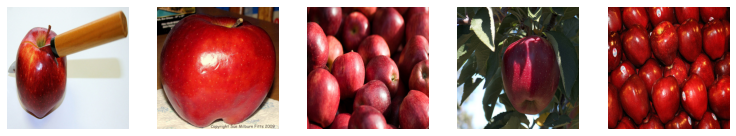

Translated Orange Images


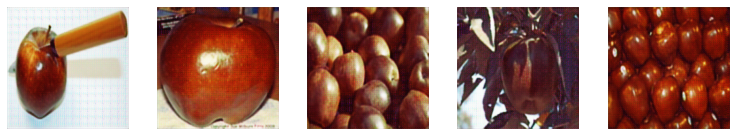

Translated back to Apples


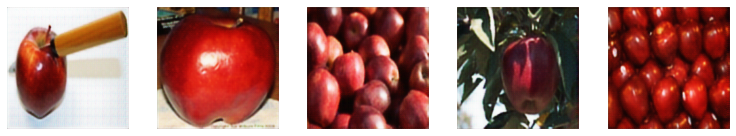

Epoch:55, Step:0, DA-Loss:0.017, DA-Acc:100.000, DB-Loss:0.021, DB-Acc:99.547, G-Loss:1.533
Epoch:55, Step:5, DA-Loss:0.036, DA-Acc:99.598, DB-Loss:0.037, DB-Acc:98.703, G-Loss:1.901
Epoch:55, Step:10, DA-Loss:0.016, DA-Acc:99.977, DB-Loss:0.012, DB-Acc:99.973, G-Loss:1.733
Epoch:55, Step:15, DA-Loss:0.027, DA-Acc:99.359, DB-Loss:0.047, DB-Acc:97.695, G-Loss:1.597
Epoch:56, Step:0, DA-Loss:0.011, DA-Acc:99.996, DB-Loss:0.015, DB-Acc:99.996, G-Loss:1.732
Epoch:56, Step:5, DA-Loss:0.024, DA-Acc:99.602, DB-Loss:0.030, DB-Acc:99.863, G-Loss:1.516
Epoch:56, Step:10, DA-Loss:0.038, DA-Acc:99.945, DB-Loss:0.049, DB-Acc:97.703, G-Loss:1.602
Epoch:56, Step:15, DA-Loss:0.034, DA-Acc:99.980, DB-Loss:0.021, DB-Acc:99.711, G-Loss:1.507
Epoch:57, Step:0, DA-Loss:0.023, DA-Acc:99.727, DB-Loss:0.013, DB-Acc:99.859, G-Loss:1.607
Epoch:57, Step:5, DA-Loss:0.006, DA-Acc:100.000, DB-Loss:0.019, DB-Acc:100.000, G-Loss:1.486
Epoch:57, Step:10, DA-Loss:0.014, DA-Acc:99.992, DB-Loss:0.012, DB-Acc:100.000, G-L

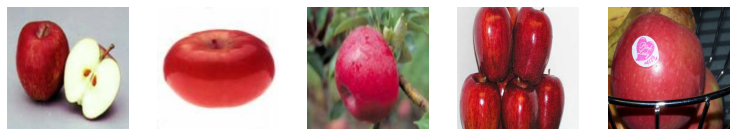

Translated Orange Images


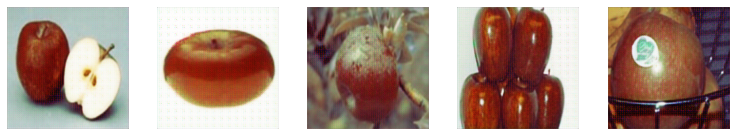

Translated back to Apples


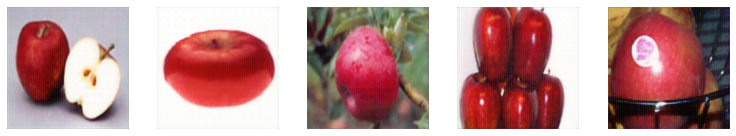

Epoch:60, Step:0, DA-Loss:0.267, DA-Acc:78.645, DB-Loss:0.131, DB-Acc:89.238, G-Loss:2.315
Epoch:60, Step:5, DA-Loss:0.025, DA-Acc:99.090, DB-Loss:0.027, DB-Acc:99.918, G-Loss:1.754
Epoch:60, Step:10, DA-Loss:0.051, DA-Acc:96.441, DB-Loss:0.027, DB-Acc:99.957, G-Loss:1.582
Epoch:60, Step:15, DA-Loss:0.021, DA-Acc:99.406, DB-Loss:0.018, DB-Acc:99.902, G-Loss:1.627
Epoch:61, Step:0, DA-Loss:0.021, DA-Acc:99.840, DB-Loss:0.036, DB-Acc:98.906, G-Loss:1.528
Epoch:61, Step:5, DA-Loss:0.087, DA-Acc:94.809, DB-Loss:0.095, DB-Acc:93.125, G-Loss:1.799
Epoch:61, Step:10, DA-Loss:0.031, DA-Acc:99.836, DB-Loss:0.039, DB-Acc:99.801, G-Loss:1.629
Epoch:61, Step:15, DA-Loss:0.019, DA-Acc:99.992, DB-Loss:0.023, DB-Acc:99.988, G-Loss:1.570
Epoch:62, Step:0, DA-Loss:0.029, DA-Acc:99.902, DB-Loss:0.028, DB-Acc:99.469, G-Loss:1.478
Epoch:62, Step:5, DA-Loss:0.012, DA-Acc:100.000, DB-Loss:0.011, DB-Acc:99.949, G-Loss:1.530
Epoch:62, Step:10, DA-Loss:0.027, DA-Acc:99.488, DB-Loss:0.029, DB-Acc:99.652, G-Loss

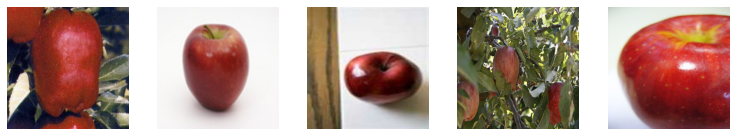

Translated Orange Images


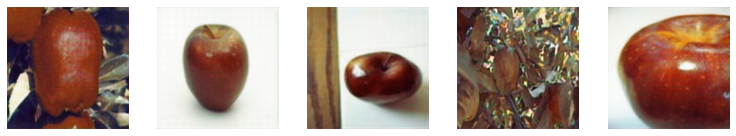

Translated back to Apples


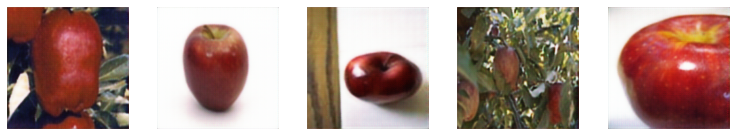

Epoch:65, Step:0, DA-Loss:0.064, DA-Acc:96.516, DB-Loss:0.046, DB-Acc:98.016, G-Loss:1.544
Epoch:65, Step:5, DA-Loss:0.022, DA-Acc:99.297, DB-Loss:0.018, DB-Acc:99.223, G-Loss:1.550
Epoch:65, Step:10, DA-Loss:0.077, DA-Acc:96.016, DB-Loss:0.045, DB-Acc:98.344, G-Loss:1.527
Epoch:65, Step:15, DA-Loss:0.023, DA-Acc:99.555, DB-Loss:0.025, DB-Acc:99.992, G-Loss:1.481
Epoch:66, Step:0, DA-Loss:0.018, DA-Acc:99.977, DB-Loss:0.021, DB-Acc:99.691, G-Loss:1.532
Epoch:66, Step:5, DA-Loss:0.055, DA-Acc:99.340, DB-Loss:0.033, DB-Acc:98.848, G-Loss:1.546
Epoch:66, Step:10, DA-Loss:0.032, DA-Acc:98.676, DB-Loss:0.049, DB-Acc:98.465, G-Loss:1.624
Epoch:66, Step:15, DA-Loss:0.619, DA-Acc:50.484, DB-Loss:0.284, DB-Acc:72.230, G-Loss:3.961
Epoch:67, Step:0, DA-Loss:0.018, DA-Acc:99.992, DB-Loss:0.023, DB-Acc:99.852, G-Loss:2.128
Epoch:67, Step:5, DA-Loss:0.017, DA-Acc:99.781, DB-Loss:0.017, DB-Acc:99.656, G-Loss:1.840
Epoch:67, Step:10, DA-Loss:0.015, DA-Acc:99.832, DB-Loss:0.014, DB-Acc:99.953, G-Loss:

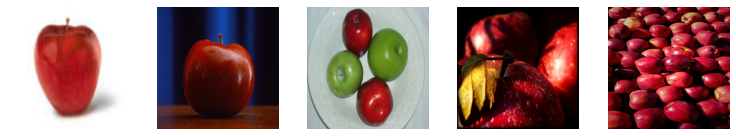

Translated Orange Images


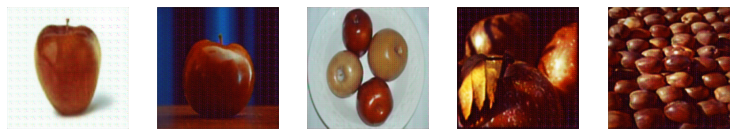

Translated back to Apples


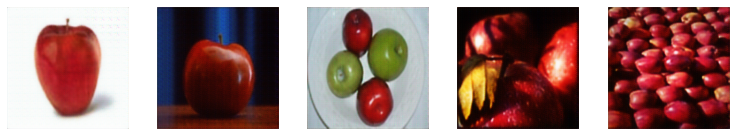

Epoch:70, Step:0, DA-Loss:0.055, DA-Acc:96.031, DB-Loss:0.041, DB-Acc:99.832, G-Loss:1.681
Epoch:70, Step:5, DA-Loss:0.018, DA-Acc:99.973, DB-Loss:0.010, DB-Acc:99.992, G-Loss:1.617
Epoch:70, Step:10, DA-Loss:0.019, DA-Acc:99.719, DB-Loss:0.011, DB-Acc:99.801, G-Loss:1.515
Epoch:70, Step:15, DA-Loss:0.019, DA-Acc:99.359, DB-Loss:0.012, DB-Acc:99.949, G-Loss:1.499
Epoch:71, Step:0, DA-Loss:0.020, DA-Acc:99.645, DB-Loss:0.019, DB-Acc:99.816, G-Loss:1.609
Epoch:71, Step:5, DA-Loss:0.014, DA-Acc:100.000, DB-Loss:0.010, DB-Acc:99.996, G-Loss:1.466
Epoch:71, Step:10, DA-Loss:0.027, DA-Acc:99.062, DB-Loss:0.018, DB-Acc:99.215, G-Loss:1.451
Epoch:71, Step:15, DA-Loss:0.014, DA-Acc:99.996, DB-Loss:0.012, DB-Acc:99.719, G-Loss:1.411
Epoch:72, Step:0, DA-Loss:0.013, DA-Acc:99.973, DB-Loss:0.016, DB-Acc:100.000, G-Loss:1.552
Epoch:72, Step:5, DA-Loss:0.010, DA-Acc:100.000, DB-Loss:0.010, DB-Acc:100.000, G-Loss:1.434
Epoch:72, Step:10, DA-Loss:0.008, DA-Acc:100.000, DB-Loss:0.006, DB-Acc:99.980, G-

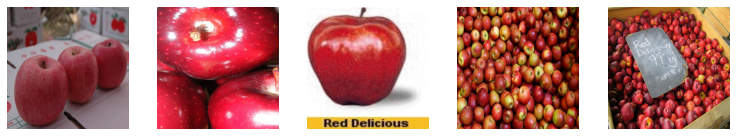

Translated Orange Images


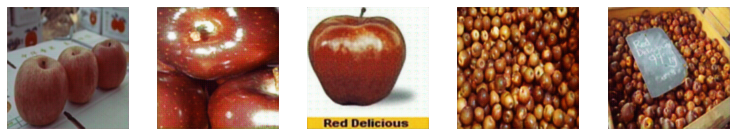

Translated back to Apples


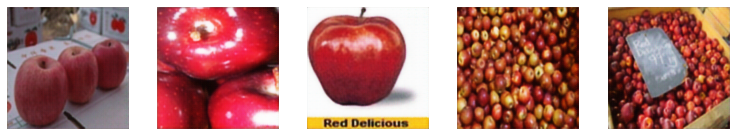

Epoch:75, Step:0, DA-Loss:0.018, DA-Acc:99.539, DB-Loss:0.016, DB-Acc:99.996, G-Loss:1.467
Epoch:75, Step:5, DA-Loss:0.020, DA-Acc:99.613, DB-Loss:0.019, DB-Acc:98.949, G-Loss:1.508
Epoch:75, Step:10, DA-Loss:0.028, DA-Acc:98.895, DB-Loss:0.028, DB-Acc:99.750, G-Loss:1.490
Epoch:75, Step:15, DA-Loss:0.050, DA-Acc:97.418, DB-Loss:0.059, DB-Acc:99.660, G-Loss:1.406
Epoch:76, Step:0, DA-Loss:0.009, DA-Acc:99.914, DB-Loss:0.021, DB-Acc:99.996, G-Loss:1.505
Epoch:76, Step:5, DA-Loss:0.061, DA-Acc:94.938, DB-Loss:0.068, DB-Acc:97.914, G-Loss:1.593
Epoch:76, Step:10, DA-Loss:0.049, DA-Acc:98.473, DB-Loss:0.088, DB-Acc:94.363, G-Loss:1.633
Epoch:76, Step:15, DA-Loss:0.034, DA-Acc:99.508, DB-Loss:0.024, DB-Acc:99.992, G-Loss:1.926
Epoch:77, Step:0, DA-Loss:0.025, DA-Acc:99.988, DB-Loss:0.020, DB-Acc:99.449, G-Loss:1.568
Epoch:77, Step:5, DA-Loss:0.011, DA-Acc:100.000, DB-Loss:0.011, DB-Acc:99.895, G-Loss:1.357
Epoch:77, Step:10, DA-Loss:0.011, DA-Acc:99.973, DB-Loss:0.008, DB-Acc:99.969, G-Loss

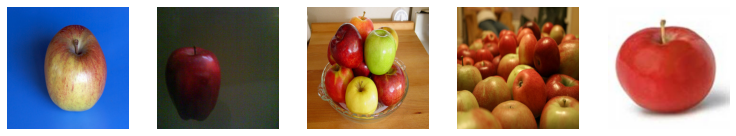

Translated Orange Images


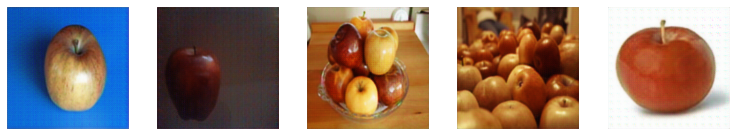

Translated back to Apples


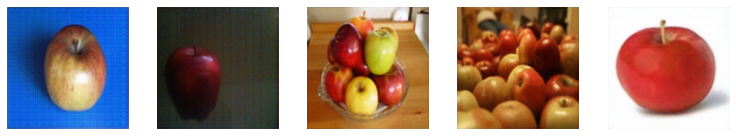

Epoch:80, Step:0, DA-Loss:0.014, DA-Acc:99.922, DB-Loss:0.012, DB-Acc:99.945, G-Loss:1.359
Epoch:80, Step:5, DA-Loss:0.017, DA-Acc:99.891, DB-Loss:0.012, DB-Acc:99.957, G-Loss:1.467
Epoch:80, Step:10, DA-Loss:0.018, DA-Acc:99.875, DB-Loss:0.018, DB-Acc:99.059, G-Loss:1.375
Epoch:80, Step:15, DA-Loss:0.030, DA-Acc:99.687, DB-Loss:0.030, DB-Acc:98.266, G-Loss:1.426
Epoch:81, Step:0, DA-Loss:0.013, DA-Acc:99.996, DB-Loss:0.024, DB-Acc:99.723, G-Loss:1.433
Epoch:81, Step:5, DA-Loss:0.010, DA-Acc:99.953, DB-Loss:0.008, DB-Acc:99.812, G-Loss:1.339
Epoch:81, Step:10, DA-Loss:0.033, DA-Acc:98.254, DB-Loss:0.027, DB-Acc:99.086, G-Loss:1.623
Epoch:81, Step:15, DA-Loss:0.024, DA-Acc:99.809, DB-Loss:0.020, DB-Acc:99.809, G-Loss:1.430
Epoch:82, Step:0, DA-Loss:0.116, DA-Acc:96.379, DB-Loss:0.063, DB-Acc:95.758, G-Loss:1.433
Epoch:82, Step:5, DA-Loss:0.036, DA-Acc:98.117, DB-Loss:0.132, DB-Acc:84.887, G-Loss:1.969
Epoch:82, Step:10, DA-Loss:0.007, DA-Acc:99.977, DB-Loss:0.007, DB-Acc:99.992, G-Loss:

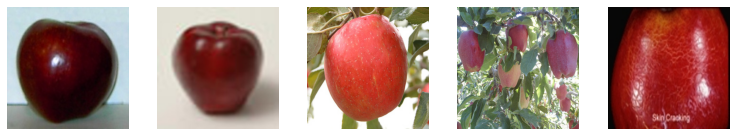

Translated Orange Images


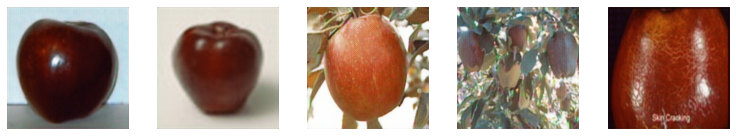

Translated back to Apples


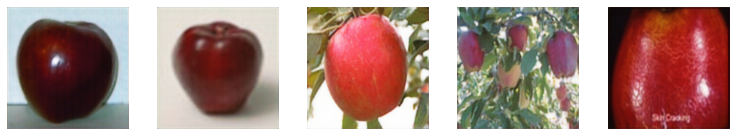

Epoch:85, Step:0, DA-Loss:0.016, DA-Acc:99.680, DB-Loss:0.018, DB-Acc:99.430, G-Loss:1.537
Epoch:85, Step:5, DA-Loss:0.027, DA-Acc:99.961, DB-Loss:0.027, DB-Acc:98.879, G-Loss:1.385
Epoch:85, Step:10, DA-Loss:0.028, DA-Acc:100.000, DB-Loss:0.036, DB-Acc:97.723, G-Loss:1.301
Epoch:85, Step:15, DA-Loss:0.020, DA-Acc:100.000, DB-Loss:0.012, DB-Acc:99.711, G-Loss:1.380
Epoch:86, Step:0, DA-Loss:0.028, DA-Acc:99.848, DB-Loss:0.022, DB-Acc:99.734, G-Loss:1.372
Epoch:86, Step:5, DA-Loss:0.032, DA-Acc:98.746, DB-Loss:0.155, DB-Acc:89.281, G-Loss:1.502
Epoch:86, Step:10, DA-Loss:0.058, DA-Acc:95.805, DB-Loss:0.052, DB-Acc:96.387, G-Loss:1.669
Epoch:86, Step:15, DA-Loss:0.021, DA-Acc:99.672, DB-Loss:0.022, DB-Acc:99.848, G-Loss:1.393
Epoch:87, Step:0, DA-Loss:0.019, DA-Acc:99.992, DB-Loss:0.026, DB-Acc:99.527, G-Loss:1.420
Epoch:87, Step:5, DA-Loss:0.027, DA-Acc:99.547, DB-Loss:0.031, DB-Acc:99.145, G-Loss:1.396
Epoch:87, Step:10, DA-Loss:0.068, DA-Acc:95.328, DB-Loss:0.041, DB-Acc:100.000, G-Lo

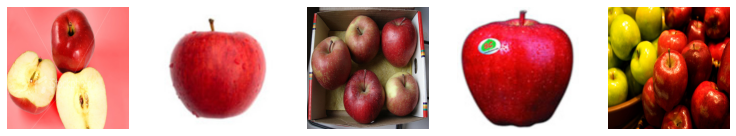

Translated Orange Images


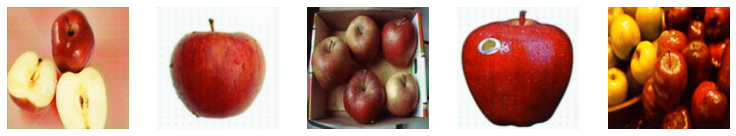

Translated back to Apples


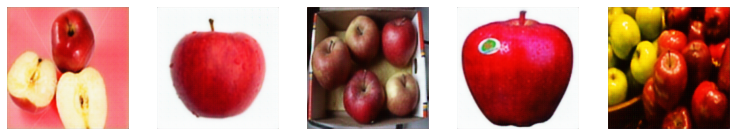

Epoch:90, Step:0, DA-Loss:0.027, DA-Acc:99.156, DB-Loss:0.028, DB-Acc:99.199, G-Loss:1.309
Epoch:90, Step:5, DA-Loss:0.028, DA-Acc:98.363, DB-Loss:0.014, DB-Acc:99.977, G-Loss:1.355
Epoch:90, Step:10, DA-Loss:0.011, DA-Acc:99.930, DB-Loss:0.012, DB-Acc:100.000, G-Loss:1.359
Epoch:90, Step:15, DA-Loss:0.020, DA-Acc:99.930, DB-Loss:0.023, DB-Acc:99.984, G-Loss:1.307


In [ ]:
epochs = 500
batch_size = 50
steps = 20

for i in range(0, epochs):
    if (i%5 == 0):
        show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA)
    if (i%5 == 2):
        show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA)

    for j in range(steps):  
        # A == Apples
        # B == Oranges
        domain_A_images = get_apple_samples(batch_size)
        domain_B_images = get_orange_samples(batch_size)

        fake_patch = np.zeros((batch_size, 16, 16, 1))
        real_patch = np.ones((batch_size, 16, 16, 1))
        
        fake_B_images = generator_network_AB(domain_A_images)
        fake_A_images = generator_network_BA(domain_B_images)
        
        # Updating Discriminator A weights
        discriminator_network_A.trainable=True
        discriminator_network_B.trainable=False
        loss_d_real_A = discriminator_network_A.train_on_batch(domain_A_images, real_patch)
        loss_d_fake_A = discriminator_network_A.train_on_batch(fake_A_images, fake_patch)
        
        loss_d_A = np.add(loss_d_real_A, loss_d_fake_A)/2.0
        
        # Updating Discriminator B weights
        discriminator_network_B.trainable=True
        discriminator_network_A.trainable=False
        loss_d_real_B = discriminator_network_B.train_on_batch(domain_B_images, real_patch)
        loss_d_fake_B = discriminator_network_B.train_on_batch(fake_B_images, fake_patch)
        
        loss_d_B = np.add(loss_d_real_B, loss_d_fake_B)/2.0
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        
        discriminator_network_A.trainable=False
        discriminator_network_B.trainable=False
        
        # Updating Generator weights
        loss_g = cycle_gan.train_on_batch([domain_A_images, domain_B_images],\
                    [real_patch, real_patch, domain_A_images, domain_B_images, domain_A_images, domain_B_images])
        
        if j%5 == 0:
            print ("Epoch:%.0f, Step:%.0f, DA-Loss:%.3f, DA-Acc:%.3f, DB-Loss:%.3f, DB-Acc:%.3f, G-Loss:%.3f"\
                   %(i,j,loss_d_A[0],loss_d_A[1]*100,loss_d_B[0],loss_d_B[1]*100,loss_g[0]))
            

In [ ]:
generator_network_AB.save("/content/gdrive/MyDrive/GAN_datasets/A2O_model")
generator_network_BA.save("/content/gdrive/MyDrive/GAN_datasets/O2A_model")

In [ ]:
show_

In [1]:
1+1

2